# Stage 3-1 — CASA `simobserve` and dirty-image generation

Stage 1が保存したlensed sky FITSを読み、`simobserve`と`tclean(niter=0)`を実行し Stage 3-2で使用するDirty imageとStage 4で使用する visibilityを作成する。
最初のpilot観測で必要な天体fluxを測り、`inbright`を`mock_stage3.toml`で指定されたS/N比を満たすようにスケーリングして再度`simobserve`する。加えて、データ量削減のためTOMLで指定したbaseline-dependent time averagingを行う。

In [1]:
import hashlib
import json
import os
import shutil
try:
    import tomllib
except ModuleNotFoundError:  # Python < 3.11 in some CASA environments
    import tomli as tomllib
from pathlib import Path

import matplotlib.pyplot as plt
import numpy as np
from astropy.coordinates import SkyCoord
from astropy.io import fits
from astropy.table import Table
from astropy.constants import c as cspeed
import astropy.units as u
from casatasks import exportfits, mstransform, simobserve, tclean
from casatools import table

%matplotlib inline

EXAMPLE_DIR = Path.cwd().resolve()
if EXAMPLE_DIR.name == "examples":
    EXAMPLE_DIR = EXAMPLE_DIR / "forward_mass"
if not (EXAMPLE_DIR.name == "forward_mass" and EXAMPLE_DIR.parent.name == "examples"):
    raise FileNotFoundError("Run this notebook from examples/forward_mass or examples.")


## Stage 1 mockとALMA設定の読み込み

- `mock_manifest.json`: Stage 1が保存したFITSの場所、grid、周波数軸
- `mock_stage3.toml`: array構成、積分時間、天候、weighting、目標peak S/N

Stage 1 FITSのhashも後で確認する。入力が変わったcaseだけ再計算する。

In [2]:
# 観測・撮像・S/N規格化の設定を読む。
with (EXAMPLE_DIR / "mock_stage3.toml").open("rb") as handle:
    CONFIG = tomllib.load(handle)

# Stage 1のFITSを再生成せず、そのmanifestから読み込む。
MANIFEST_PATH = EXAMPLE_DIR / "output" / "stage1" / "products" / "mock_manifest.json"
if not MANIFEST_PATH.exists():
    raise FileNotFoundError("Run Stage 1 first to create output/stage1/products/mock_manifest.json")
MOCK_MANIFEST = json.loads(MANIFEST_PATH.read_text())
if MOCK_MANIFEST.get("schema_version") != 2:
    raise ValueError("Unsupported Stage 1 manifest schema")

alma_cfg = CONFIG["alma"]
target = MOCK_MANIFEST["target"]
image_grid_cfg = MOCK_MANIFEST["image_grid"]
velocity_channels_kms = np.asarray(
    MOCK_MANIFEST["spectral"]["velocity_channels_kms"], dtype=float,
)
REFERENCE_FREQUENCY_HZ = float(target["reference_frequency_hz"])

STAGE3_DIR = EXAMPLE_DIR / "output" / "stage3"
CASA_WORK_DIR = STAGE3_DIR / "casa_work"
PRODUCT_DIR = STAGE3_DIR / "products"
CASA_WORK_DIR.mkdir(parents=True, exist_ok=True)
PRODUCT_DIR.mkdir(parents=True, exist_ok=True)

# CASAが受け取るJ2000 phase-center文字列へ変換する。
phase_center = SkyCoord(
    target["phase_center_ra_deg"] * u.deg,
    target["phase_center_dec_deg"] * u.deg,
    frame="icrs",
)
phase_center_ra = phase_center.ra.to_string(unit=u.hour, sep=":", precision=8, pad=True)
phase_center_dec = phase_center.dec.to_string(
    unit=u.deg, sep=".", precision=8, pad=True, alwayssign=True,
)
PHASE_CENTER_CASA = f"J2000 {phase_center_ra} {phase_center_dec}"
print(f'Loaded {len(MOCK_MANIFEST["cases"])} Stage 1 sky models')


Loaded 7 Stage 1 sky models


## CASA・FITS用の補助関数

ここでは次の処理をまとめる。

- velocityとfrequencyの変換
- CASA FITS cubeの読み込みとchannel順の統一
- dirty RMSの推定
- MSからvisibility、weight、flag、uvwを抽出
- noiseless/noisy MSを使ったnoise振幅の調整

Stage 3-1だけで使う処理なのでnotebook内に置く。

In [3]:
"""Small, CASA-independent helpers for ALMA mock-data experiments."""

from pathlib import Path

import numpy as np
from astropy.io import fits

C_KMS = 299792.458


def frequencies_from_radio_velocity(
    velocity_kms: np.ndarray, reference_frequency_hz: float
) -> np.ndarray:
    """Convert radio-definition velocities to observed frequencies."""
    return reference_frequency_hz * (1.0 - np.asarray(velocity_kms) / C_KMS)


def write_casa_sky_model(
    path: str | Path,
    cube_jy_per_pixel: np.ndarray,
    *,
    pixel_size_arcsec: float,
    velocity_kms: np.ndarray,
    reference_frequency_hz: float,
    phase_center_ra_deg: float,
    phase_center_dec_deg: float,
) -> Path:
    """Write a 3D FITS sky model with celestial and frequency WCS for CASA."""
    cube = np.asarray(cube_jy_per_pixel, dtype=np.float32)
    frequencies_hz = frequencies_from_radio_velocity(velocity_kms, reference_frequency_hz)
    if cube.ndim != 3 or cube.shape[0] != frequencies_hz.size:
        raise ValueError("cube must have shape (len(velocity_kms), ny, nx)")
    if frequencies_hz.size < 2:
        raise ValueError("at least two spectral channels are required")

    ny, nx = cube.shape[-2:]
    header = fits.Header()
    header["BUNIT"] = "Jy/pixel"
    header["BTYPE"] = "Intensity"
    header["RADESYS"] = "ICRS"
    header["SPECSYS"] = "LSRK"
    header["RESTFRQ"] = float(reference_frequency_hz)
    header["CTYPE1"] = "RA---TAN"
    header["CTYPE2"] = "DEC--TAN"
    header["CTYPE3"] = "FREQ"
    header["CUNIT1"] = "deg"
    header["CUNIT2"] = "deg"
    header["CUNIT3"] = "Hz"
    header["CRPIX1"] = (nx + 1.0) / 2.0
    header["CRPIX2"] = (ny + 1.0) / 2.0
    header["CRPIX3"] = 1.0
    header["CRVAL1"] = float(phase_center_ra_deg)
    header["CRVAL2"] = float(phase_center_dec_deg)
    header["CRVAL3"] = float(frequencies_hz[0])
    header["CDELT1"] = -float(pixel_size_arcsec) / 3600.0
    header["CDELT2"] = float(pixel_size_arcsec) / 3600.0
    header["CDELT3"] = float(np.median(np.diff(frequencies_hz)))

    output = Path(path)
    output.parent.mkdir(parents=True, exist_ok=True)
    fits.writeto(output, cube, header=header, overwrite=True)
    return output


def load_casa_cube(
    path: str | Path, reference_frequency_hz: float
) -> tuple[np.ndarray, np.ndarray, fits.Header]:
    """Load a CASA-exported FITS cube and sort its channels by velocity."""
    data, header = fits.getdata(path, header=True)
    cube = np.squeeze(np.asarray(data, dtype=np.float32))
    if cube.ndim != 3:
        raise ValueError(f"expected a 3D cube after squeeze, got {cube.shape}")
    channels = np.arange(cube.shape[0], dtype=float) + 1.0
    frequencies_hz = header["CRVAL3"] + (channels - header["CRPIX3"]) * header["CDELT3"]
    velocity_kms = C_KMS * (1.0 - frequencies_hz / reference_frequency_hz)
    order = np.argsort(velocity_kms)
    return cube[order], velocity_kms[order], header


def normalize_dirty_psf(psf_cube: np.ndarray) -> np.ndarray:
    """Normalize every dirty-beam plane to unit central peak."""
    psf = np.asarray(psf_cube, dtype=np.float32).copy()
    peaks = np.max(psf, axis=(-2, -1))
    if np.any(~np.isfinite(peaks)) or np.any(peaks <= 0):
        raise ValueError("every dirty PSF plane must have a finite positive peak")
    psf /= peaks[:, None, None]
    return psf


# 輝線のないcube両端から外れ値に強いRMSを測る。
def robust_dirty_rms(cube: np.ndarray, edge_channels: int = 2) -> float:
    """Estimate image RMS from line-free channels using the MAD."""
    if edge_channels < 1 or 2 * edge_channels > cube.shape[0]:
        raise ValueError("edge_channels is incompatible with the cube")
    samples = np.concatenate((cube[:edge_channels].ravel(), cube[-edge_channels:].ravel()))
    median = np.median(samples)
    return float(1.482602218505602 * np.median(np.abs(samples - median)))


def load_uv_npz(path: str | Path) -> dict[str, np.ndarray | float]:
    """Load the compact visibility product written by ``casa_simulation.py``."""
    with np.load(path, allow_pickle=False) as archive:
        result = {name: archive[name] for name in archive.files}
    velocity = np.asarray(result["v_kms"])
    order = np.argsort(velocity)
    for name in ("v_kms", "freqs", "data", "sigma", "weight", "flag"):
        result[name] = np.asarray(result[name])[order]
    result["uvw_lam"] = np.asarray(result["uvw_lam"])[:, order]
    return result


def primary_beam_from_uv_product(
    xx_arcsec: np.ndarray, yy_arcsec: np.ndarray, uv_product: dict
) -> np.ndarray:
    """Return a single PB plane at the mean channel frequency."""
    radius_arcsec = np.hypot(xx_arcsec, yy_arcsec)
    fwhm_arcsec = float(np.mean(uv_product["pb_fwhm_arcsec"]))
    return np.exp(-4.0 * np.log(2.0) * radius_arcsec**2 / fwhm_arcsec**2)


In [4]:
C_MS = cspeed.to_value(u.m / u.s)


def _remove_products(prefix: Path) -> None:
    for path in prefix.parent.glob(prefix.name + ".*"):
        if path.is_dir():
            shutil.rmtree(path)
        else:
            path.unlink()


def _find_noisy_ms(project: Path) -> Path:
    matches = sorted(project.glob("*.noisy.ms"))
    if len(matches) != 1:
        raise RuntimeError(f"expected one noisy MS in {project}, found {matches}")
    return matches[0]


def _find_noiseless_ms(project: Path) -> Path:
    matches = sorted(
        path for path in project.glob("*.ms") if not path.name.endswith(".noisy.ms")
    )
    if len(matches) != 1:
        raise RuntimeError(f"expected one noiseless MS in {project}, found {matches}")
    return matches[0]


def _cleanup_case_workdir(project: Path, averaged_ms: Path) -> None:
    """Keep the averaged data MS and compact noisy/signal UV archives."""
    keep = {
        averaged_ms.resolve(), (project / "uv_data.npz").resolve(),
        (project / "signal_uv_data.npz").resolve(),
    }
    for path in project.iterdir():
        if path.resolve() in keep:
            continue
        shutil.rmtree(path) if path.is_dir() else path.unlink()


def _average_ms(input_ms: Path, output_ms: Path, max_uv_distance_m: float) -> None:
    """Baseline-dependent time averaging without frequency averaging."""
    if output_ms.exists():
        shutil.rmtree(output_ms)
    mstransform(
        vis=str(input_ms), outputvis=str(output_ms), datacolumn="data",
        timeaverage=True, timebin="10000000s", timespan="scan",
        maxuvwdistance=float(max_uv_distance_m), keepflags=True,
        usewtspectrum=True,
    )


# polarizationをweight平均し、後段で必要なvisibility情報だけNPZへ保存する。
def _export_uv_product(ms_path: Path, output_path: Path, reference_frequency_hz: float) -> None:
    tb = table()
    tb.open(str(ms_path))
    columns = set(tb.colnames())
    data = np.asarray(tb.getcol("DATA"))
    flag = np.asarray(tb.getcol("FLAG"), dtype=bool)
    uvw_m = np.asarray(tb.getcol("UVW"), dtype=float)
    if "WEIGHT_SPECTRUM" in columns:
        try:
            weight = np.asarray(tb.getcol("WEIGHT_SPECTRUM"), dtype=float)
        except Exception:
            weight = np.asarray(tb.getcol("WEIGHT"), dtype=float)[:, None, :]
    else:
        weight = np.asarray(tb.getcol("WEIGHT"), dtype=float)[:, None, :]
    tb.close()

    if data.ndim != 3:
        raise RuntimeError(f"unexpected DATA shape {data.shape}")
    weight = np.broadcast_to(weight, data.shape)
    # flag済みvisibilityはweight=0としてpolarization平均から除く。
    usable_weight = np.where(flag, 0.0, weight)
    denominator = usable_weight.sum(axis=0)
    numerator = (usable_weight * data).sum(axis=0)
    visibility = np.divide(
        numerator, denominator, out=np.zeros_like(numerator), where=denominator > 0
    )
    sigma = np.full(denominator.shape, np.inf, dtype=float)
    sigma[denominator > 0] = 1.0 / np.sqrt(denominator[denominator > 0])
    combined_flag = denominator <= 0

    tb.open(str(ms_path / "SPECTRAL_WINDOW"))
    frequencies_hz = np.asarray(tb.getcol("CHAN_FREQ")[:, 0], dtype=float)
    tb.close()
    tb.open(str(ms_path / "FIELD"))
    phase_direction_deg = np.rad2deg(np.squeeze(tb.getcol("PHASE_DIR")))
    tb.close()

    wavelength_m = C_MS / frequencies_hz
    # baseline [m]をchannelごとの波長単位へ変換する。
    uvw_wavelength = uvw_m[:, None, :] / wavelength_m[None, :, None]
    velocity_kms = (C_MS / 1000.0) * (1.0 - frequencies_hz / reference_frequency_hz)
    pb_fwhm_arcsec = 1.13 * wavelength_m / 12.0 * (180.0 / np.pi) * 3600.0
    order = np.argsort(velocity_kms)
    output_path.parent.mkdir(parents=True, exist_ok=True)
    np.savez_compressed(
        output_path,
        uvw_m=uvw_m,
        uvw_lam=uvw_wavelength[:, order],
        data=visibility[order],
        sigma=sigma[order],
        weight=denominator[order],
        flag=combined_flag[order],
        freqs=frequencies_hz[order],
        v_kms=velocity_kms[order],
        pb_fwhm_arcsec=pb_fwhm_arcsec[order],
        phase_dir_deg=phase_direction_deg,
    )


# niter=0なのでdeconvolutionせず、samplingとweightが作るdirty imageを得る。
def _make_dirty_fits(
    ms_path: Path, image_prefix: Path, fits_path: Path, common: dict
) -> np.ndarray:
    """Image one MS with niter=0, export it, and return velocity-sorted data."""
    _remove_products(image_prefix)
    tclean(
        vis=str(ms_path),
        datacolumn="data",
        imagename=str(image_prefix),
        imsize=int(common["imsize"]),
        cell=common["cell"],
        weighting=common["weighting"],
        robust=float(common["robust"]),
        niter=0,
        specmode="cube",
        interpolation="nearest",
        outframe="LSRK",
        stokes="I",
        restfreq=f'{common["reference_frequency_hz"]}Hz',
        interactive=False,
        calcres=True,
        calcpsf=True,
    )
    exportfits(
        imagename=str(image_prefix) + ".image",
        fitsimage=str(fits_path),
        dropdeg=True,
        overwrite=True,
    )
    cube, _, _ = load_casa_cube(fits_path, common["reference_frequency_hz"])
    return cube


def _peak_sn(cube: np.ndarray, edge_channels: int) -> float:
    rms = robust_dirty_rms(cube, edge_channels)
    return np.inf if rms == 0.0 else float(np.max(cube) / rms)


def _solve_flux_scale(
    signal_cube: np.ndarray,
    noisy_cube: np.ndarray,
    target_peak_sn: float,
    edge_channels: int,
) -> tuple[float, float, float]:
    """Find f for f * signal + fixed CASA noise at the target peak S/N."""
    if target_peak_sn <= 0:
        raise ValueError("target_peak_sn must be positive")
    # 同じsampling・weightで撮像した差をthermal-noise成分とみなす。
    noise_cube = noisy_cube - signal_cube
    pilot_peak_sn = _peak_sn(noisy_cube, edge_channels)

    def peak_sn(flux_scale):
        return _peak_sn(flux_scale * signal_cube + noise_cube, edge_channels)

    lower, upper = 0.0, 1.0
    if peak_sn(lower) >= target_peak_sn:
        raise RuntimeError("target peak S/N is below the noise-only image peak")
    # fluxを増やしてtargetを挟み、二分法でscaleを決める。
    while peak_sn(upper) < target_peak_sn and upper < 1.0e6:
        upper *= 2.0
    if peak_sn(upper) < target_peak_sn:
        raise RuntimeError(
            f"could not bracket target peak S/N={target_peak_sn:g}"
        )
    for _ in range(50):
        middle = 0.5 * (lower + upper)
        if peak_sn(middle) < target_peak_sn:
            lower = middle
        else:
            upper = middle
    flux_scale = 0.5 * (lower + upper)
    return flux_scale, pilot_peak_sn, peak_sn(flux_scale)


def _make_signal_dirty_with_noisy_weights(
    noiseless_ms: Path,
    noisy_ms: Path,
    image_prefix: Path,
    fits_path: Path,
    common: dict,
) -> np.ndarray:
    """Image noiseless DATA using exactly the noisy MS sampling and weights."""
    tb = table()
    tb.open(str(noiseless_ms))
    signal = np.asarray(tb.getcol("DATA"))
    tb.close()
    tb.open(str(noisy_ms), nomodify=False)
    original = np.asarray(tb.getcol("DATA"))
    if original.shape != signal.shape:
        tb.close()
        raise RuntimeError("noiseless and noisy DATA columns have different shapes")
    tb.putcol("DATA", signal)
    tb.close()
    try:
        return _make_dirty_fits(noisy_ms, image_prefix, fits_path, common)
    finally:
        tb.open(str(noisy_ms), nomodify=False)
        tb.putcol("DATA", original)
        tb.close()


def _run_simobserve(project: Path, common: dict, case: dict, inbright: str = "") -> None:
    """Run one CASA simulation with fixed observing conditions."""
    if project.exists():
        shutil.rmtree(project)
    project.parent.mkdir(parents=True, exist_ok=True)
    original_directory = Path.cwd()
    os.chdir(project.parent)
    try:
        simobserve(
            project=project.name,
            skymodel=str(Path(case["sky_model"]).resolve()),
            inbright=inbright,
            indirection="", incell=common["cell"], outframe="LSRK",
            setpointings=True, integration=common["integration"],
            direction=common["direction"], mapsize=common["mapsize"],
            maptype="hexagonal", obsmode="int",
            antennalist=str(Path(common["antennalist"]).resolve()),
            refdate=common["refdate"], hourangle=common["hourangle"],
            totaltime=common["totaltime"], thermalnoise="tsys-atm",
            user_pwv=float(common["user_pwv_mm"]),
            t_ground=float(common["ground_temperature_k"]),
            seed=int(case["seed"]), graphics="none", verbose=False,
            overwrite=True,
        )
    finally:
        os.chdir(original_directory)


def _ms_rows(ms_path: Path) -> int:
    tb = table()
    tb.open(str(ms_path))
    rows = int(tb.nrows())
    tb.close()
    return rows


def run_case(common: dict, case: dict) -> dict:
    project = Path(case["project"]).resolve()
    pilot = project.with_name(project.name + "_pilot")
    edge_channels = int(common["line_free_edge_channels"])

    # 1回目は元fluxで観測し、CASAが作るnoiseは変更せず必要なfluxだけ測る。
    _run_simobserve(pilot, common, case)
    pilot_signal_ms = _find_noiseless_ms(pilot)
    pilot_noisy_ms = _find_noisy_ms(pilot)
    pilot_signal_avg = pilot / "signal.averaged.ms"
    pilot_noisy_avg = pilot / "noisy.averaged.ms"
    _average_ms(pilot_signal_ms, pilot_signal_avg, common["max_uv_distance_m"])
    _average_ms(pilot_noisy_ms, pilot_noisy_avg, common["max_uv_distance_m"])
    pilot_cube = _make_dirty_fits(
        pilot_noisy_avg, pilot / "pilot_dirty", pilot / "pilot_dirty.fits", common,
    )
    signal_cube = _make_signal_dirty_with_noisy_weights(
        pilot_signal_avg, pilot_noisy_avg,
        pilot / "signal_dirty", pilot / "signal_dirty.fits", common,
    )
    flux_scale, pilot_peak_sn, solved_peak_sn = _solve_flux_scale(
        signal_cube, pilot_cube, float(common["target_peak_sn"]), edge_channels,
    )
    sky_peak = float(np.nanmax(fits.getdata(case["sky_model"])))
    inbright_jy_per_pixel = sky_peak * flux_scale
    shutil.rmtree(pilot)

    # 2回目はinbrightだけ変更。同じ観測時間・PWVなのでthermal noiseは物理値のまま。
    _run_simobserve(
        project, common, case, inbright=f"{inbright_jy_per_pixel:.16g}Jy/pixel",
    )
    noiseless_ms = _find_noiseless_ms(project)
    noisy_ms = _find_noisy_ms(project)
    averaged_ms = project / "final.averaged.ms"
    averaged_signal_ms = project / "signal.averaged.ms"
    input_rows = _ms_rows(noisy_ms)
    _average_ms(noisy_ms, averaged_ms, common["max_uv_distance_m"])
    # signal-only MSも同じbinで平均し、Stage 4の数値誤差診断に使う。
    _average_ms(noiseless_ms, averaged_signal_ms, common["max_uv_distance_m"])
    averaged_rows = _ms_rows(averaged_ms)

    image_prefix = project / "dirty"
    final_cube = _make_dirty_fits(
        averaged_ms, image_prefix,
        Path(case["product_dir"]) / "dirty.image.fits", common,
    )
    achieved_peak_sn = _peak_sn(final_cube, edge_channels)
    exportfits(
        imagename=str(image_prefix) + ".psf",
        fitsimage=str(Path(case["product_dir"]) / "dirty.psf.fits"),
        dropdeg=True, overwrite=True,
    )
    _export_uv_product(
        averaged_ms, project / "uv_data.npz", float(common["reference_frequency_hz"])
    )
    _export_uv_product(
        averaged_signal_ms, project / "signal_uv_data.npz",
        float(common["reference_frequency_hz"]),
    )
    normalization = {
        "target_peak_sn": float(common["target_peak_sn"]),
        "pilot_peak_sn": pilot_peak_sn,
        "flux_scale": flux_scale,
        "inbright_jy_per_pixel": inbright_jy_per_pixel,
        "solved_peak_sn": solved_peak_sn,
        "achieved_peak_sn": achieved_peak_sn,
        "max_uv_distance_m": float(common["max_uv_distance_m"]),
        "input_visibility_rows": input_rows,
        "averaged_visibility_rows": averaged_rows,
    }
    Path(case["normalization_path"]).write_text(
        json.dumps(normalization, indent=2, sort_keys=True)
    )
    print(
        f"STAGE3_CASE_COMPLETE {case['name']}: "
        f"peak S/N {pilot_peak_sn:.3f} -> {achieved_peak_sn:.3f}, "
        f"flux scale={flux_scale:.5g}, rows={input_rows:,}->{averaged_rows:,}"
    )
    # 最終FITSはproductsに保存済み。作業領域には平均済みMSとUV archiveだけ残す。
    _cleanup_case_workdir(project, averaged_ms)
    return normalization




## `simobserve`、flux規格化、dirty image作成

各caseについて以下を行う。

1. 元fluxでpilot `simobserve`を行う
2. 固定CASA noiseに対して必要な天体flux scaleを求める
3. `inbright`だけを変更して同じ1時間観測を再実行する
4. TOMLの`max_uv_distance_m`を上限に時間平均する
5. 平均済みMSからdirty image、dirty PSF、visibilityを保存する

既存productのsignatureが現在の設定と一致すれば、そのcaseはskipする。

In [5]:
# 再計算が必要なcaseだけこのlistへ入れる。
manifest_cases = []
for case_index, case in enumerate(MOCK_MANIFEST["cases"]):
    name = case["name"]
    sky_path = (MANIFEST_PATH.parent / case["lensed_sky_cube"]).resolve()
    if not sky_path.exists():
        raise FileNotFoundError(f"Missing Stage 1 sky model: {sky_path}")
    # manifest記録時からStage 1 FITSが変わっていないか確認する。
    sky_sha256 = hashlib.sha256(sky_path.read_bytes()).hexdigest()
    if sky_sha256 != case["lensed_sha256"]:
        raise ValueError(f"Stage 1 sky-model checksum mismatch: {name}")

    case_dir = CASA_WORK_DIR / name
    project = case_dir / "simulation"
    product_dir = PRODUCT_DIR / name
    product_dir.mkdir(parents=True, exist_ok=True)
    required = (
        product_dir / "dirty.image.fits",
        product_dir / "dirty.psf.fits",
        project / "uv_data.npz",
        project / "signal_uv_data.npz",
        product_dir / "sn_normalization.json",
    )
    signature = {
        "schema_version": 2,
        "alma": alma_cfg,
        "case_name": name,
        "lensed_sha256": sky_sha256,
    }
    signature_path = product_dir / "simulation_signature.json"
    # 必要ファイルとsignatureが揃うcaseはCASA計算を再利用する。
    current = all(path.exists() for path in required)
    if current:
        try:
            current = json.loads(signature_path.read_text()) == signature
        except (OSError, json.JSONDecodeError):
            current = False
    if not current or os.getenv("STAGE3_FORCE_SIMOBSERVE", "0") == "1":
        manifest_cases.append({
            "name": name,
            "sky_model": str(sky_path),
            "project": str(project),
            "product_dir": str(product_dir),
            "normalization_path": str(product_dir / "sn_normalization.json"),
            "seed": int(alma_cfg["random_seed"]) + case_index,
            "signature": signature,
            "signature_path": str(signature_path),
        })

# 全caseで共通するCASA引数。caseごとに変わるのはsky modelとseedだけ。
common = {
    "direction": PHASE_CENTER_CASA,
    "cell": f'{image_grid_cfg["pixel_size_arcsec"]}arcsec',
    "mapsize": [
        f'{image_grid_cfg["grid_size"] * image_grid_cfg["pixel_size_arcsec"]}arcsec'
    ] * 2,
    "imsize": int(image_grid_cfg["grid_size"]),
    "antennalist": str((EXAMPLE_DIR / alma_cfg["antenna_configuration"]).resolve()),
    "integration": alma_cfg["integration"],
    "totaltime": alma_cfg["total_time"],
    "refdate": alma_cfg["reference_date"],
    "hourangle": alma_cfg["hour_angle"],
    "user_pwv_mm": alma_cfg["user_pwv_mm"],
    "ground_temperature_k": alma_cfg["ground_temperature_k"],
    "weighting": alma_cfg["weighting"],
    "robust": alma_cfg["robust"],
    "reference_frequency_hz": REFERENCE_FREQUENCY_HZ,
    "target_peak_sn": float(alma_cfg["target_peak_sn"]),
    "max_uv_distance_m": float(alma_cfg["max_uv_distance_m"]),
    "line_free_edge_channels": int(CONFIG["image_fit"]["line_free_edge_channels"]),
}

if manifest_cases:
    print(f"Running CASA directly for {len(manifest_cases)} case(s).")
    for item in manifest_cases:
        run_case(common, item)
        Path(item["signature_path"]).write_text(
            json.dumps(item["signature"], indent=2, sort_keys=True)
        )
else:
    print("All CASA products match the Stage 1 sky models and current ALMA settings.")


Running CASA directly for 7 case(s).


....10....20....30....40....50....60....70....80....90....100%
2026-08-14 16:35:16	WARN	MSTransformManager::parseTimeAvgParams	Operating with ALMA data, automatically adding state to timespan 
2026-08-14 16:35:16	WARN	MSTransformManager::parseTimeAvgParams+	In order to remove sub-scan boundaries which limit time average to 30s 
2026-08-14 16:35:24	WARN	MSTransformManager::parseTimeAvgParams	Operating with ALMA data, automatically adding state to timespan 
2026-08-14 16:35:24	WARN	MSTransformManager::parseTimeAvgParams+	In order to remove sub-scan boundaries which limit time average to 30s 
2026-08-14 16:35:34	WARN	task_tclean::SIImageStore::restore (file /source/casa6/casatools/src/code/synthesis/ImagerObjects/SIImageStore.cc, line 2284)	Restoring with an empty model image. Only residuals will be processed to form the output restored image.
2026-08-14 16:35:40	WARN	task_tclean::SIImageStore::restore (file /source/casa6/casatools/src/code/synthesis/ImagerObjects/SIImageStore.cc, line 22

STAGE3_CASE_COMPLETE bt10_re03: peak S/N 63.705 -> 20.000, flux scale=0.30289, rows=325,080->6,132


....10....20....30....40....50....60....70....80....90....100%
2026-08-14 16:37:17	WARN	MSTransformManager::parseTimeAvgParams	Operating with ALMA data, automatically adding state to timespan 
2026-08-14 16:37:17	WARN	MSTransformManager::parseTimeAvgParams+	In order to remove sub-scan boundaries which limit time average to 30s 
2026-08-14 16:37:24	WARN	MSTransformManager::parseTimeAvgParams	Operating with ALMA data, automatically adding state to timespan 
2026-08-14 16:37:24	WARN	MSTransformManager::parseTimeAvgParams+	In order to remove sub-scan boundaries which limit time average to 30s 
2026-08-14 16:37:35	WARN	task_tclean::SIImageStore::restore (file /source/casa6/casatools/src/code/synthesis/ImagerObjects/SIImageStore.cc, line 2284)	Restoring with an empty model image. Only residuals will be processed to form the output restored image.
2026-08-14 16:37:40	WARN	task_tclean::SIImageStore::restore (file /source/casa6/casatools/src/code/synthesis/ImagerObjects/SIImageStore.cc, line 22

STAGE3_CASE_COMPLETE bt10_re06: peak S/N 61.623 -> 20.000, flux scale=0.30737, rows=325,080->6,132


....10....20....30....40....50....60....70....80....90....100%
2026-08-14 16:39:19	WARN	MSTransformManager::parseTimeAvgParams	Operating with ALMA data, automatically adding state to timespan 
2026-08-14 16:39:19	WARN	MSTransformManager::parseTimeAvgParams+	In order to remove sub-scan boundaries which limit time average to 30s 
2026-08-14 16:39:26	WARN	MSTransformManager::parseTimeAvgParams	Operating with ALMA data, automatically adding state to timespan 
2026-08-14 16:39:26	WARN	MSTransformManager::parseTimeAvgParams+	In order to remove sub-scan boundaries which limit time average to 30s 
2026-08-14 16:39:36	WARN	task_tclean::SIImageStore::restore (file /source/casa6/casatools/src/code/synthesis/ImagerObjects/SIImageStore.cc, line 2284)	Restoring with an empty model image. Only residuals will be processed to form the output restored image.
2026-08-14 16:39:41	WARN	task_tclean::SIImageStore::restore (file /source/casa6/casatools/src/code/synthesis/ImagerObjects/SIImageStore.cc, line 22

STAGE3_CASE_COMPLETE bt25_re03: peak S/N 54.935 -> 20.000, flux scale=0.36248, rows=325,080->6,132


....10....20....30....40....50....60....70....80....90....100%
2026-08-14 16:41:19	WARN	MSTransformManager::parseTimeAvgParams	Operating with ALMA data, automatically adding state to timespan 
2026-08-14 16:41:19	WARN	MSTransformManager::parseTimeAvgParams+	In order to remove sub-scan boundaries which limit time average to 30s 
2026-08-14 16:41:26	WARN	MSTransformManager::parseTimeAvgParams	Operating with ALMA data, automatically adding state to timespan 
2026-08-14 16:41:26	WARN	MSTransformManager::parseTimeAvgParams+	In order to remove sub-scan boundaries which limit time average to 30s 
2026-08-14 16:41:37	WARN	task_tclean::SIImageStore::restore (file /source/casa6/casatools/src/code/synthesis/ImagerObjects/SIImageStore.cc, line 2284)	Restoring with an empty model image. Only residuals will be processed to form the output restored image.
2026-08-14 16:41:42	WARN	task_tclean::SIImageStore::restore (file /source/casa6/casatools/src/code/synthesis/ImagerObjects/SIImageStore.cc, line 22

STAGE3_CASE_COMPLETE bt25_re06: peak S/N 62.142 -> 20.000, flux scale=0.30932, rows=325,080->6,132


....10....20....30....40....50....60....70....80....90....100%
2026-08-14 16:43:18	WARN	MSTransformManager::parseTimeAvgParams	Operating with ALMA data, automatically adding state to timespan 
2026-08-14 16:43:18	WARN	MSTransformManager::parseTimeAvgParams+	In order to remove sub-scan boundaries which limit time average to 30s 
2026-08-14 16:43:25	WARN	MSTransformManager::parseTimeAvgParams	Operating with ALMA data, automatically adding state to timespan 
2026-08-14 16:43:25	WARN	MSTransformManager::parseTimeAvgParams+	In order to remove sub-scan boundaries which limit time average to 30s 
2026-08-14 16:43:36	WARN	task_tclean::SIImageStore::restore (file /source/casa6/casatools/src/code/synthesis/ImagerObjects/SIImageStore.cc, line 2284)	Restoring with an empty model image. Only residuals will be processed to form the output restored image.
2026-08-14 16:43:41	WARN	task_tclean::SIImageStore::restore (file /source/casa6/casatools/src/code/synthesis/ImagerObjects/SIImageStore.cc, line 22

STAGE3_CASE_COMPLETE bt50_re03: peak S/N 44.688 -> 20.000, flux scale=0.41388, rows=325,080->6,132


....10....20....30....40....50....60....70....80....90....100%
2026-08-14 16:45:18	WARN	MSTransformManager::parseTimeAvgParams	Operating with ALMA data, automatically adding state to timespan 
2026-08-14 16:45:18	WARN	MSTransformManager::parseTimeAvgParams+	In order to remove sub-scan boundaries which limit time average to 30s 
2026-08-14 16:45:25	WARN	MSTransformManager::parseTimeAvgParams	Operating with ALMA data, automatically adding state to timespan 
2026-08-14 16:45:25	WARN	MSTransformManager::parseTimeAvgParams+	In order to remove sub-scan boundaries which limit time average to 30s 
2026-08-14 16:45:35	WARN	task_tclean::SIImageStore::restore (file /source/casa6/casatools/src/code/synthesis/ImagerObjects/SIImageStore.cc, line 2284)	Restoring with an empty model image. Only residuals will be processed to form the output restored image.
2026-08-14 16:45:40	WARN	task_tclean::SIImageStore::restore (file /source/casa6/casatools/src/code/synthesis/ImagerObjects/SIImageStore.cc, line 22

STAGE3_CASE_COMPLETE bt50_re06: peak S/N 55.594 -> 20.000, flux scale=0.34208, rows=325,080->6,132


....10....20....30....40....50....60....70....80....90....100%
2026-08-14 16:47:16	WARN	MSTransformManager::parseTimeAvgParams	Operating with ALMA data, automatically adding state to timespan 
2026-08-14 16:47:16	WARN	MSTransformManager::parseTimeAvgParams+	In order to remove sub-scan boundaries which limit time average to 30s 
2026-08-14 16:47:24	WARN	MSTransformManager::parseTimeAvgParams	Operating with ALMA data, automatically adding state to timespan 
2026-08-14 16:47:24	WARN	MSTransformManager::parseTimeAvgParams+	In order to remove sub-scan boundaries which limit time average to 30s 
2026-08-14 16:47:34	WARN	task_tclean::SIImageStore::restore (file /source/casa6/casatools/src/code/synthesis/ImagerObjects/SIImageStore.cc, line 2284)	Restoring with an empty model image. Only residuals will be processed to form the output restored image.
2026-08-14 16:47:39	WARN	task_tclean::SIImageStore::restore (file /source/casa6/casatools/src/code/synthesis/ImagerObjects/SIImageStore.cc, line 22

STAGE3_CASE_COMPLETE bt00: peak S/N 53.797 -> 20.000, flux scale=0.35466, rows=325,080->6,132


## dirty cubeの確認

全channel mapとcaseごとの要約表を表示する。表ではdirty RMS、peak S/N、flux scale、平均前後のvisibility数を確認する。

目標値と実測値がずれる場合は、`sn_normalization.json`とline-free channelを先に確認する。

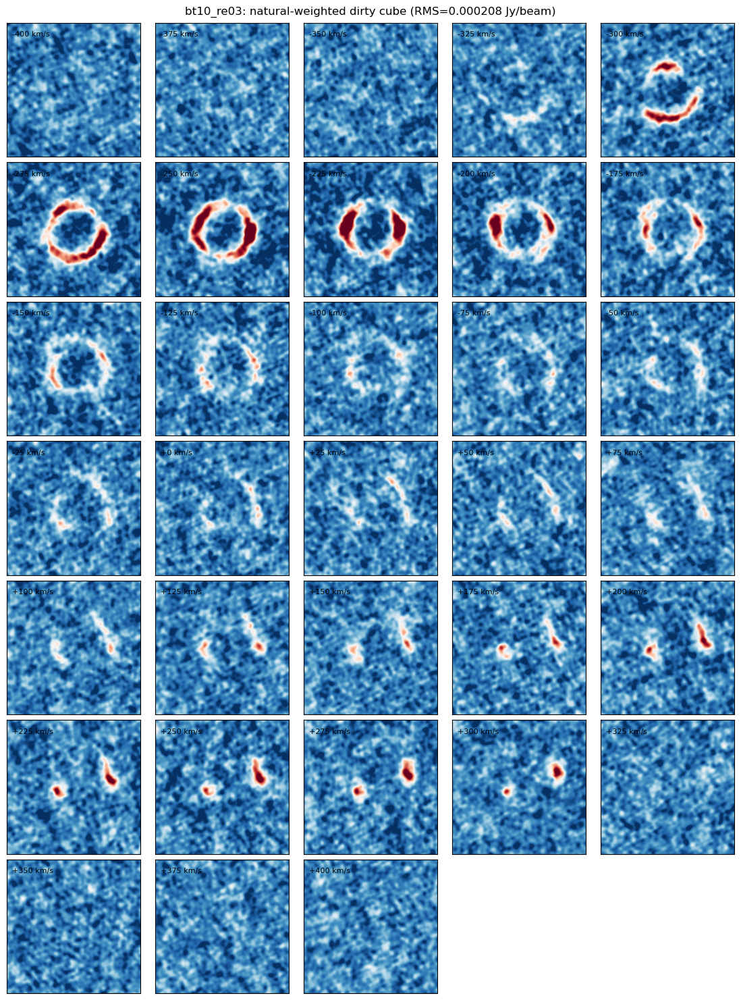

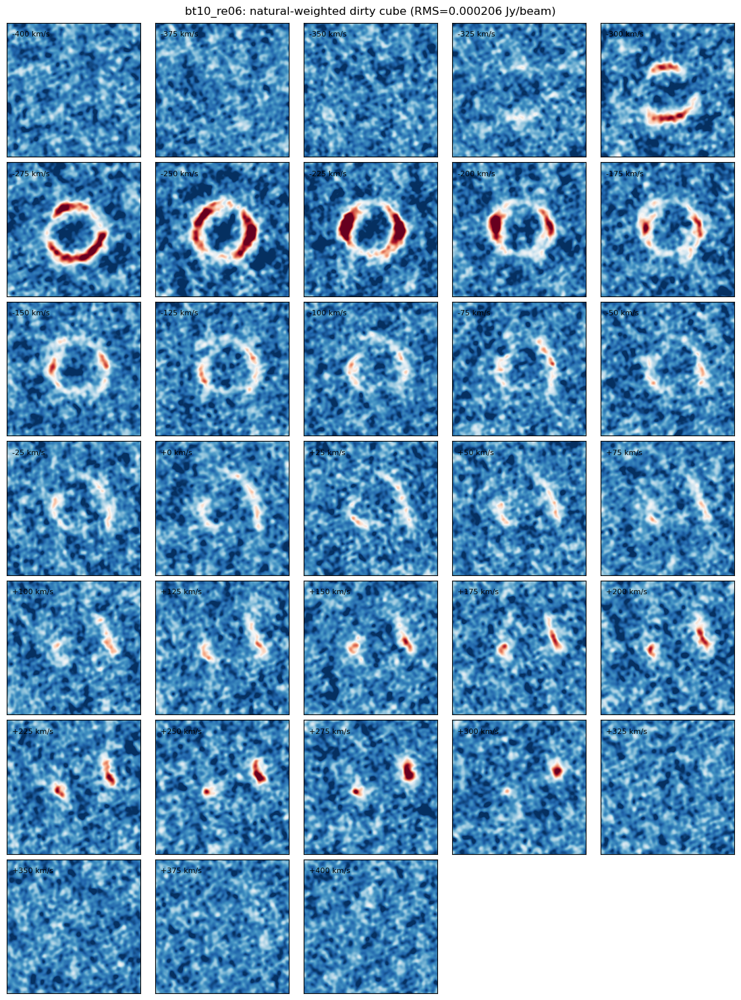

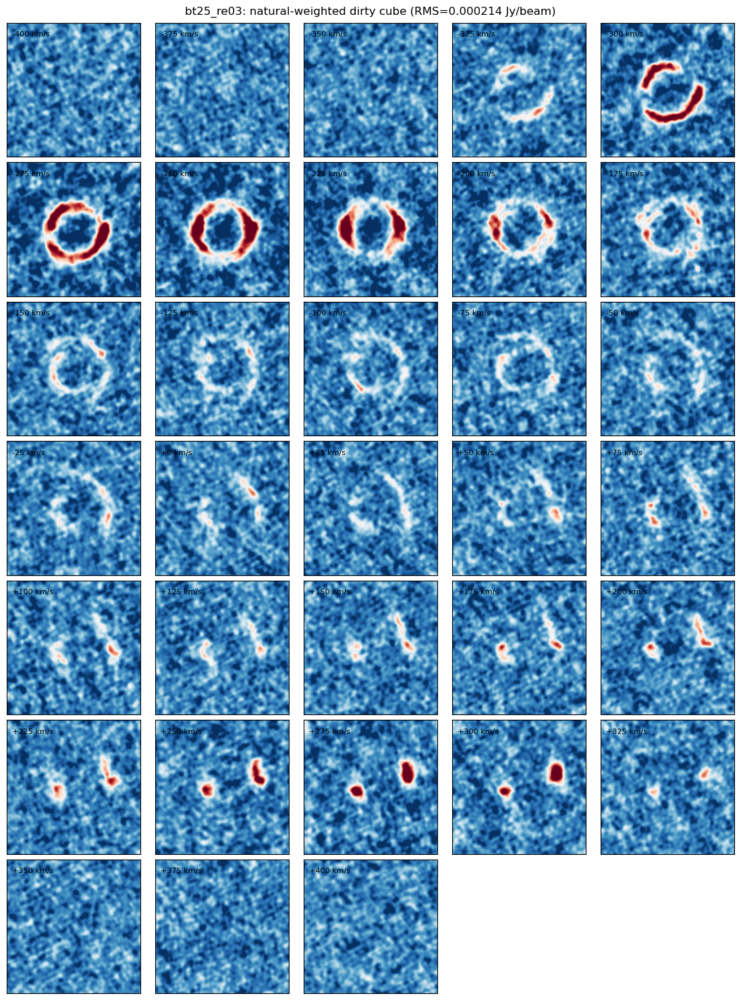

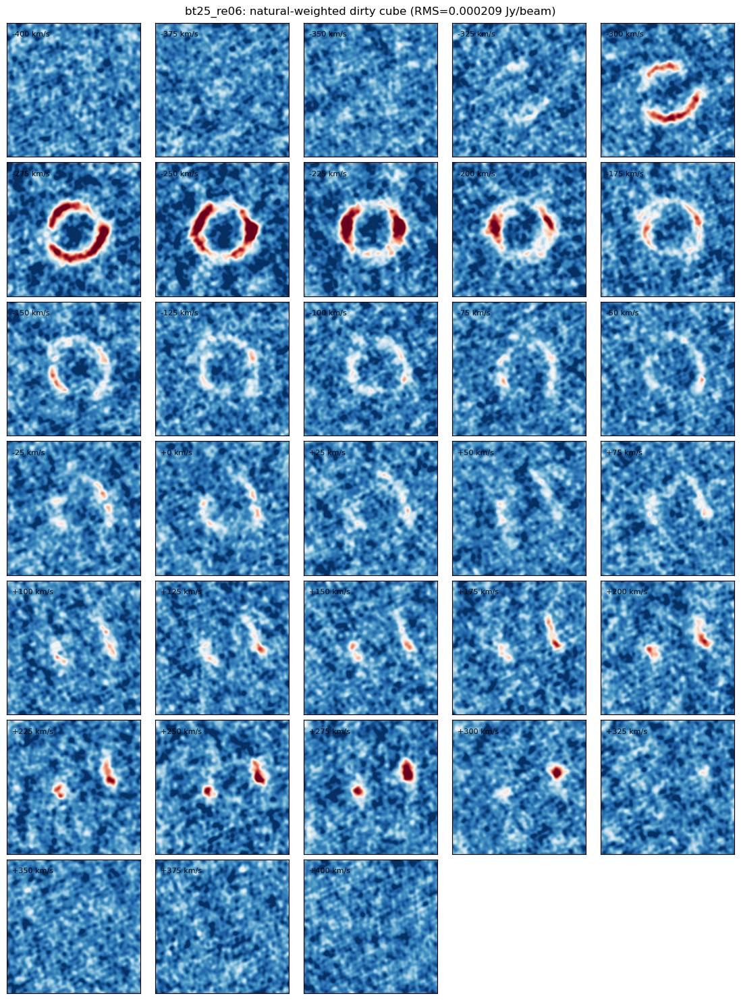

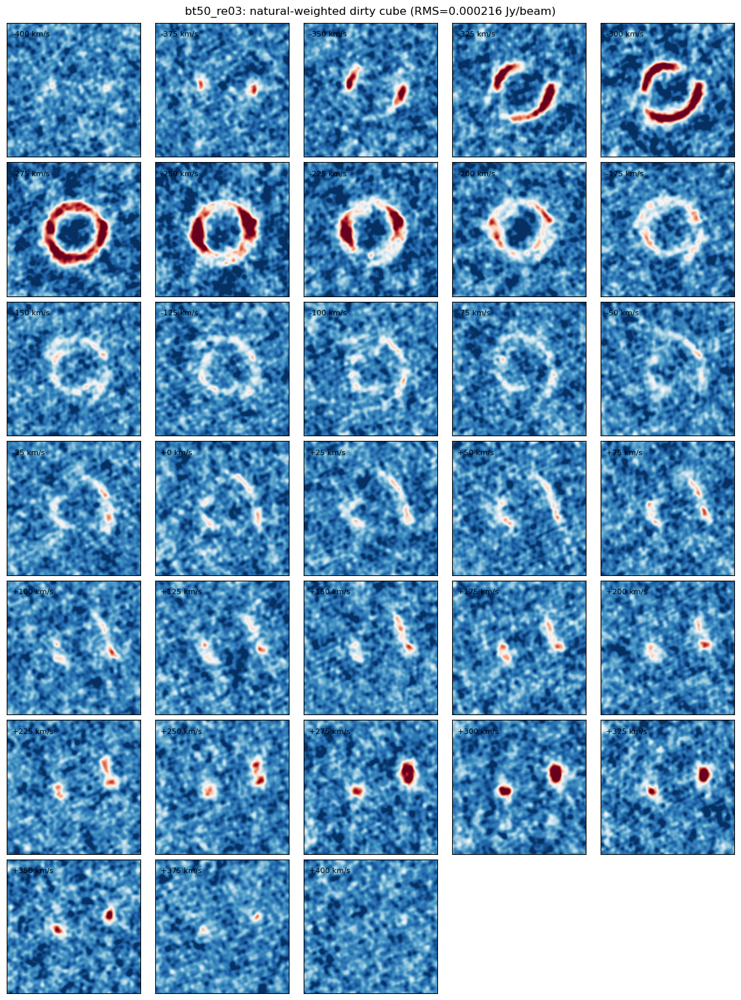

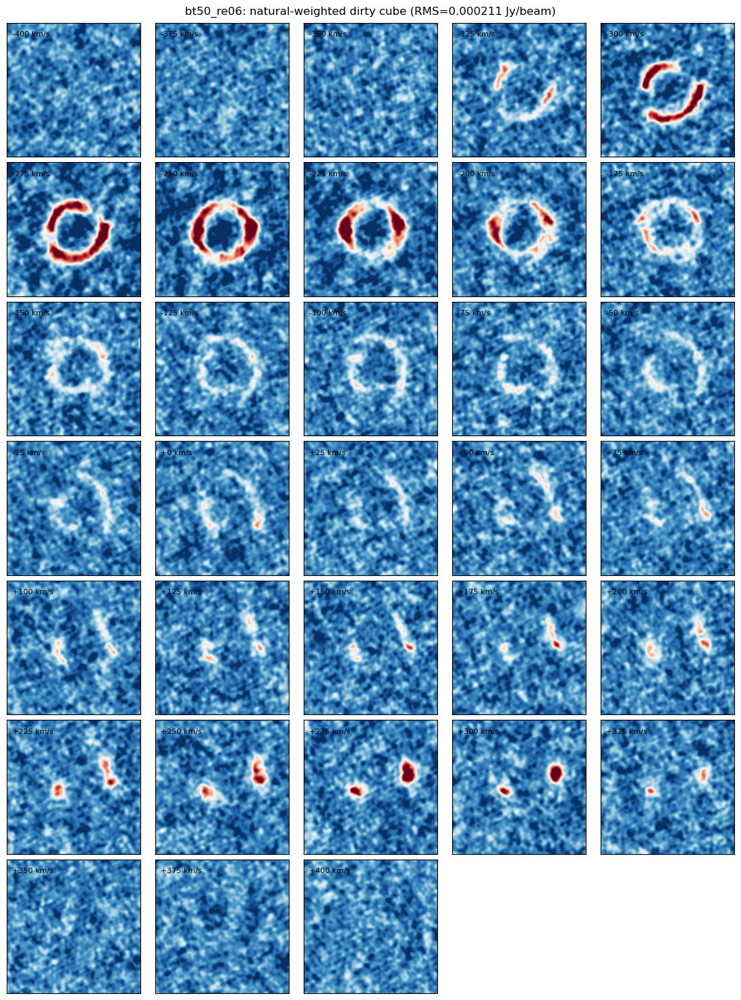

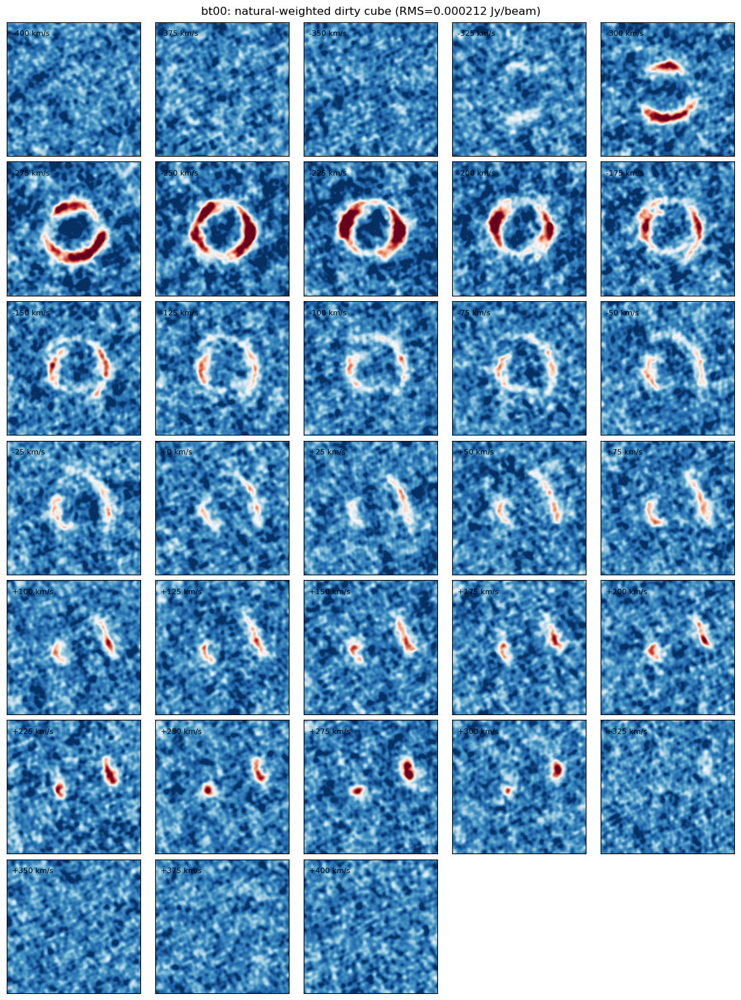

case,dirty RMS [Jy/beam],peak S/N,target peak S/N,flux scale,rows before,rows after,exported visibility rows
str9,float64,float32,float64,float64,int64,int64,int64
bt10_re03,0.00020818349730689079,20.000015,20.0,0.30288697779178664,325080,6132,6132
bt10_re06,0.00020566859166137874,19.999994,20.0,0.30736748874187425,325080,6132,6132
bt25_re03,0.00021363732230383903,20.0,20.0,0.3624753803014751,325080,6132,6132
bt25_re06,0.0002089326299028471,19.999996,20.0,0.3093189746141438,325080,6132,6132
bt50_re03,0.00021605286747217178,20.000002,20.0,0.4138772934675212,325080,6132,6132
bt50_re06,0.00021145878417883068,20.000013,20.0,0.34208361804485277,325080,6132,6132
bt00,0.0002115225070156157,19.999985,20.0,0.3546613901853557,325080,6132,6132


In [6]:
def plot_dirty_channels(cube, velocity_kms, case_name, rms, ncols=5):
    nrows = int(np.ceil(cube.shape[0] / ncols))
    fig, axes = plt.subplots(
        nrows, ncols, figsize=(2.2 * ncols, 2.1 * nrows), constrained_layout=True,
    )
    axes = np.asarray(axes).ravel()
    half_size = 0.5 * image_grid_cfg["grid_size"] * image_grid_cfg["pixel_size_arcsec"]
    extent = (-half_size, half_size, -half_size, half_size)
    for channel, ax in enumerate(axes):
        if channel >= cube.shape[0]:
            ax.set_visible(False)
            continue
        ax.imshow(
            cube[channel], origin="lower", extent=extent, cmap="RdBu_r",
            vmin=-2 * rms, vmax=10 * rms,
        )
        ax.text(
            0.04, 0.94, f"{velocity_kms[channel]:+.0f} km/s",
            transform=ax.transAxes, va="top", fontsize=8,
        )
        ax.set_xticks([])
        ax.set_yticks([])
    fig.suptitle(
        f"{case_name}: natural-weighted dirty cube (RMS={rms:.3g} Jy/beam)"
    )
    plt.show()


# 保存済みproductを読み直し、最終成果物そのものを検査する。
product_rows = []
for case in MOCK_MANIFEST["cases"]:
    product_dir = PRODUCT_DIR / case["name"]
    project = CASA_WORK_DIR / case["name"] / "simulation"
    dirty, velocity_kms, _ = load_casa_cube(
        product_dir / "dirty.image.fits", REFERENCE_FREQUENCY_HZ,
    )
    uv = load_uv_npz(project / "uv_data.npz")
    rms = robust_dirty_rms(dirty, CONFIG["image_fit"]["line_free_edge_channels"])
    normalization = json.loads(
        (product_dir / "sn_normalization.json").read_text()
    )
    product_rows.append((
        case["name"], rms, dirty.max() / rms,
        normalization["target_peak_sn"], normalization["flux_scale"],
        normalization["input_visibility_rows"],
        normalization["averaged_visibility_rows"], uv["data"].shape[-1],
    ))
    plot_dirty_channels(dirty, velocity_kms, case["name"], rms)

Table(
    rows=product_rows,
    names=(
        "case", "dirty RMS [Jy/beam]", "peak S/N",
        "target peak S/N", "flux scale", "rows before", "rows after",
        "exported visibility rows",
    ),
)
